In [28]:
using FastGaussQuadrature, Plots, DelimitedFiles, Random, KernelMatrices
using KrylovKit, IterTools, FFTW, SpecialFunctions, Slepians
using Dierckx

Random.seed!(123);
using Revise
include("RHMatrix.jl")
import Slepians: get_quadrature_nodes_2D
include("../src/relevant_slepian_alpha.jl")

get_quadrature_nodes_2D (generic function with 3 methods)

In [26]:
# important functions
using Revise
include("localization3d.jl")
import Base.sign
include("ext.jl")

customsleps_ext (generic function with 1 method)

# Generate a random 3D surface

For 3D interpolation, some simplifying assumptions have been made:
- the 3D surface has been supplied as a set of contours in z-direction
- these contours are in sorted order (easy to generalize this)
- each contour has the same number of points (if not, you have to spline the boundary and interpolate, which is not hard), and the same orientation

We will just stack a bunch of blobs.

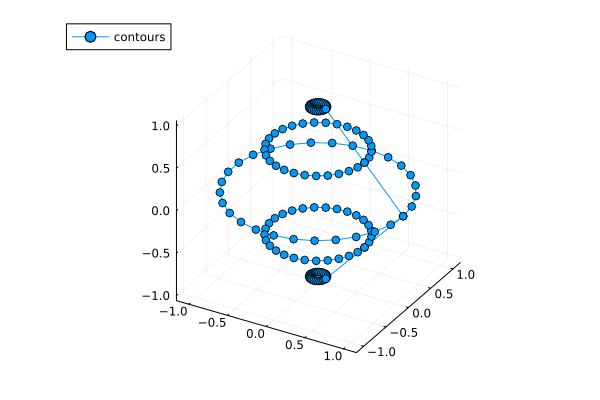

In [110]:
Nz = 5
# x, y = blob(Nz,5)
t = LinRange(0, 1, 30)
x, y = cos.(2*pi*t), sin.(2*pi*t)
N = 100

z = collect(-2:2)/2

Nx = length(x[1])
hcat(x[1], y[1])

# z, y, x is the order
# thpha = map(i -> hcat(ones(length(y[i]))*z[i], y[i], x[i]), 1:Nz)
thpha = map(i -> hcat(ones(length(y))*z[i], (1.1-abs(z[i]))*y, (1.1-abs(z[i]))*x), 1:Nz)

# ind = vcat(collect(1:2:100), 100)

# Shorten the second closed curve
# thpha[2] = hcat(thpha[2][ind, 1], thpha[2][ind, 2], thpha[2][ind, 3])

# println(size(thph))
thph = vcat(thpha...)
# This is necessary to close the curve
#thph = vcat(thph, thph[1,:]')

p = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", marker = :o)

In [37]:
thpha_new = equalNclosedcurve(thpha, N);

LoadError: UndefVarError: `equalNclosedcurve` not defined

In [38]:
thph_new = vcat(thpha_new...)
p = plot(thph_new[:,3], thph_new[:,2], thph_new[:,1], label = "contours", marker = :o)

LoadError: UndefVarError: `thpha_new` not defined

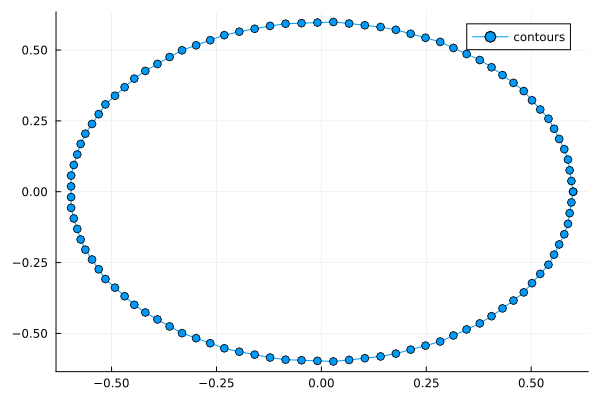

In [31]:
p = plot(thpha_new[2][:,3], thpha_new[2][:,2], label = "contours", marker = :o)

# Fill with quadrature nodes

## Get the quadrature nodes and scale to the range in z

In [32]:
Nqx = Nqy = 16
Nqz = 10

# set parameters for the integration

M  = 3
Kp = [4.0]
szs = int = (Nqx, Nqy, Nqz)
prec = 1e-8
exact = false
lvl = 6
maxrank = 256

256

In [33]:
# compute the nodes - first scale in z
colf, th, wqz = scale_quad_nodez(Nqz, z)

([1, 1, 1, 2, 2, 3, 3, 4, 4, 4], [-0.9739065285171717, -0.8650633666889845, -0.6794095682990244, -0.4333953941292472, -0.14887433898163122, 0.14887433898163122, 0.4333953941292472, 0.6794095682990244, 0.8650633666889845, 0.9739065285171717], [0.06667134430868821, 0.14945134915058056, 0.21908636251598207, 0.2692667193099965, 0.2955242247147529, 0.2955242247147529, 0.2692667193099965, 0.21908636251598207, 0.14945134915058056, 0.06667134430868821])

In [34]:
newcurve, pkg = fill2d(z, colf, thpha_new, th, Nqx, Nqy)

(LinearAlgebra.Adjoint{Float64, Matrix{Float64}}[[-0.9739065285171717 0.0 0.12609347148282835; -0.9739065285171717 0.007940249526258531 0.1252299173064265; … ; -0.9739065285171717 -0.007940249526258533 0.12522991730642652; -0.9739065285171717 -3.088399324896476e-17 0.12609347148282835], [-0.8650633666889845 0.0 0.23493663331101555; -0.8650633666889845 0.014794227404569534 0.23332766411935404; … ; -0.8650633666889845 -0.014794227404569512 0.23332766411935413; -0.8650633666889845 -5.754287919735813e-17 0.23493663331101555], [-0.6794095682990244 0.0 0.42059043170097565; -0.6794095682990244 0.026485058558462615 0.41771000799958286; … ; -0.6794095682990244 -0.026485058558462553 0.4177100079995829; -0.6794095682990244 -1.0301494518692066e-16 0.42059043170097565], [-0.4333953941292472 0.0 0.6666046058707529; -0.4333953941292472 0.041976851328800274 0.6620393481723257; … ; -0.4333953941292472 -0.0419768513288002 0.6620393481723257; -0.4333953941292472 -1.6327103937530009e-16 0.6666046058707529

In [35]:
# collate nodes weights
no, sqwt, ev = getnodeswts3d(szs, pkg, th, wqz)

([(-0.017926013243805147, -0.12452977361588856, -0.9739065285171717), (-0.017178778965041108, -0.12452977361588856, -0.9739065285171717), (-0.015862809553864522, -0.12452977361588856, -0.9739065285171717), (-0.014025362519000023, -0.12452977361588856, -0.9739065285171717), (-0.011732809975111651, -0.12452977361588856, -0.9739065285171717), (-0.009068001425214946, -0.12452977361588856, -0.9739065285171717), (-0.006127246743179469, -0.12452977361588856, -0.9739065285171717), (-0.0030168310051661533, -0.12452977361588856, -0.9739065285171717), (0.00015082811089606185, -0.12452977361588856, -0.9739065285171717), (0.003261243848909374, -0.12452977361588856, -0.9739065285171717)  …  (-0.006127246743179163, 0.12452977361588854, 0.9739065285171717), (-0.0030168310051658567, 0.12452977361588854, 0.9739065285171717), (0.00015082811089634635, 0.12452977361588854, 0.9739065285171717), (0.0032612438489096514, 0.12452977361588854, 0.9739065285171717), (0.006201998530945118, 0.12452977361588854, 0.97

In [36]:
#=
    s, sl = customsleps_ext(M, Kp, szs, prec = prec, exact = exact, lvl = lvl, maxrank = maxrank, no = no,
            sqwt = sqwt, int = nothing, ev = ev);
=#

In [37]:
# or you can do it all in one shot, without intermediates:

maxrank = 256
s, sl = slepian3(szs, z, thpha; 
                M = 3, Kp = [4.0], prec = 1e-8, exact = false, lvl = 6, 
                    maxrank = 256, int = nothing)

(ComplexF64[130.90271861622543 + 0.0im, 104.78621608811757 + 0.0im, 77.22930606762992 + 0.0im, 53.58227551297099 + 0.0im, 47.909307626028784 + 0.0im, 45.377186843995645 + 0.0im, 31.580516418488312 + 0.0im, 27.164093437563515 + 0.0im, 25.8625797833245 + 0.0im, 21.66463204661573 + 0.0im, 18.12622631933003 + 0.0im, 10.6705763389159 + 0.0im], Array{ComplexF64, 3}[[-0.011082705796963584 + 0.0im -0.01128737141732091 + 0.0im … -0.011287371577311528 + 0.0im -0.011082705912354244 + 0.0im; -0.010792517462407825 + 0.0im -0.009785490723680092 + 0.0im … -0.009785490774826164 + 0.0im -0.01079251757214507 + 0.0im; … ; -0.010778010059237134 + 0.0im -0.009729936439022027 + 0.0im … -0.009729936465093398 + 0.0im -0.010778009976684575 + 0.0im; -0.011098992099130893 + 0.0im -0.01126985334812419 + 0.0im … -0.011269853571664384 + 0.0im -0.011098992093546454 + 0.0im;;; -0.01007249413397583 + 0.0im -0.009359006815824893 + 0.0im … -0.009359007013967253 + 0.0im -0.010072494135973062 + 0.0im; -0.00876460125880431

# Sanity plot 1 - scaled quadrature points in z

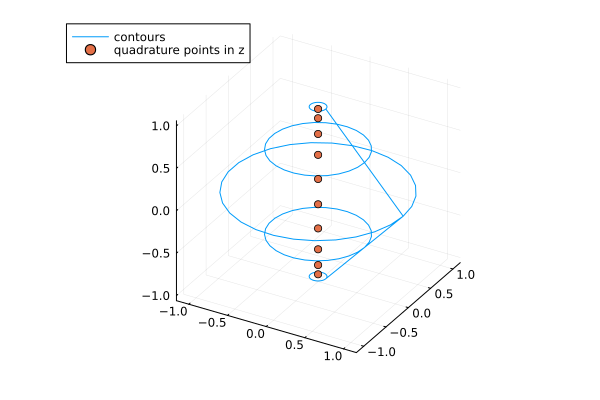

In [38]:
p1 = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours")
scatter!(p1, zeros(Nqz), zeros(Nqz), th, label = "quadrature points in z")

# Sanity plot II: Show the quadrature closed curves at each z level

Get the (x,y) values at each quadrature level z. 

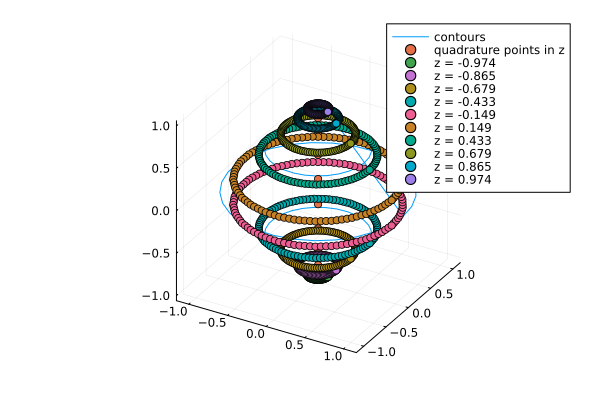

In [39]:
p2 = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours")
scatter!(p2, zeros(Nqz), zeros(Nqz), th, label = "quadrature points in z")
for i = 1:length(th)
    scatter!(p2, newcurve[i][:,3],newcurve[i][:,2],newcurve[i][:,1], label = "z = $(round(1000*th[i])/1000)")
end
p2

# Sanity plots III - IV: plot in 2D the quadrature nodes we are getting at each level.

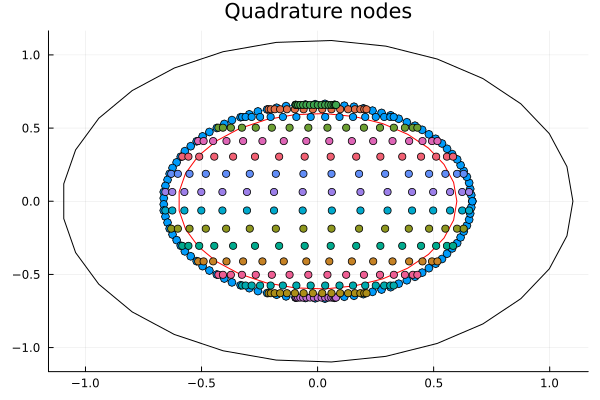

In [40]:
i = 4
N=100
q = plot(newcurve[i][:,3], newcurve[i][:,2], marker=:o, c = 1, label = "z = $(round(1000*th[i])/1000)")

plot!(q, thpha[colf[i]][:, 3], thpha[colf[i]][:,2], label = "z = $(thph[colf[i]][1,1])", c = :red)
plot!(q, thpha[colf[i]+1][:, 3], thpha[colf[i]+1][:,2], label = "z = $(thph[colf[i] + 1][1,1])", c = :black)


scatter!(q, pkg[i][1], pkg[i][2], legend = false, title = "Quadrature nodes")


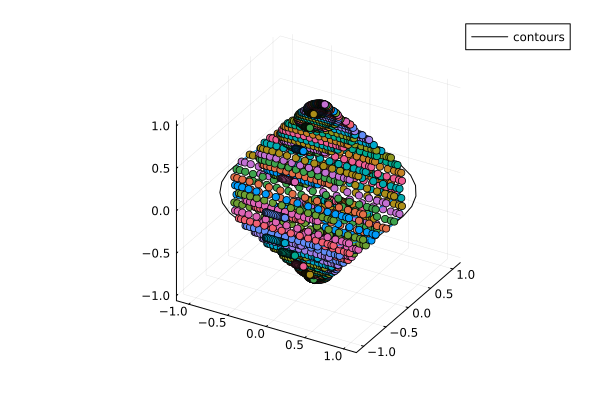

In [41]:
p3 = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", c = :black);
for i = 1:10
    plot!(p3, newcurve[i][:,3], newcurve[i][:,2], ones(size(newcurve[i][:,2]))*th[i], c = 1, label = "")
    scatter!(p3, pkg[i][1], pkg[i][2], ones(Nqx,Nqy+1)*th[i] , label = "")
end
p3

# Sanity plot V - Show the sequences

In [42]:
psimple = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", c = :black);

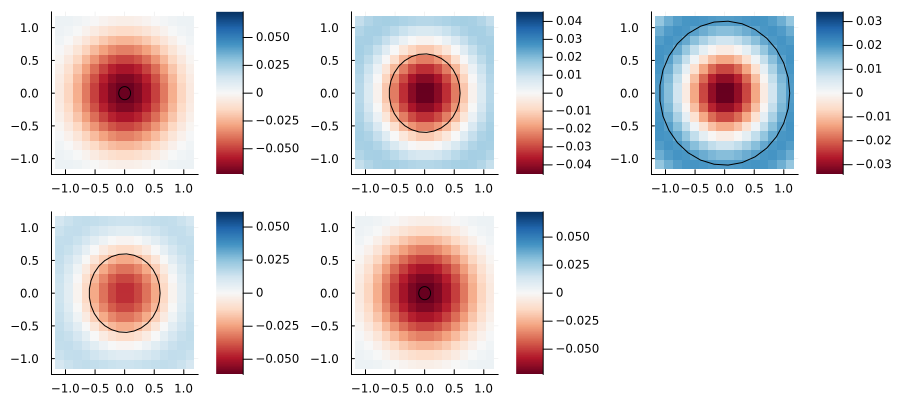

In [43]:
j = 2
ind = [1, 4, 5, 7, 10]
p2dheat = Array{Plots.Plot{Plots.GRBackend},1}(undef, 5)
for i = 1:5
    p2dheat[i] = heatmap(range(minimum(thph[:,3]), maximum(thph[:,3]), length = szs[1]), 
         range(minimum(thph[:,2]), maximum(thph[:,2]), length = szs[2]), 
         Float64.(sl[j][:,:,ind[i]]), c = :RdBu, 
         clims = (-maximum(abs.(Float64.(sl[j][:,:,2*i]))), maximum(abs.(Float64.(sl[j][:,:,2*i])))
    )
    )
    plot!(p2dheat[i], thpha[i][:,3], thpha[i][:,2], c = :black, legend = false)
end

plot(p2dheat..., size=(900, 400))
#png("sphereconc")

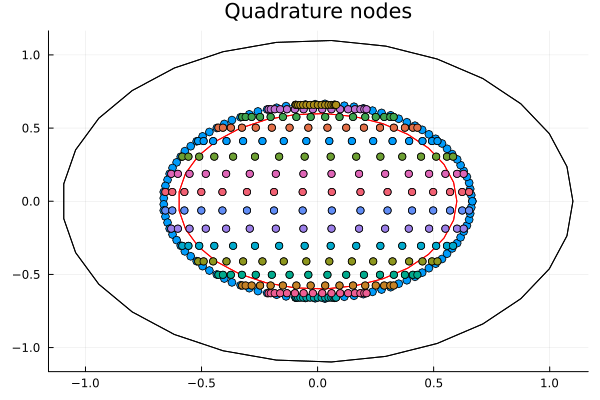

In [44]:
heatmap(range(minimum(thph[:,3]), maximum(thph[:,3]), length = szs[1]), 
         range(minimum(thph[:,2]), maximum(thph[:,2]), length = szs[2]), Float64.(sl[1][:,:,1]))

plot!(newcurve[i][:,3], newcurve[i][:,2], marker=:o, c = 1, label = "z = $(round(1000*th[i])/1000)")

plot!(q, thpha[colf[i]][:, 3], thpha[colf[i]][:,2], label = "z = $(thph[colf[i]][1,1])", c = :red)
plot!(q, thpha[colf[i]+1][:, 3], thpha[colf[i]+1][:,2], label = "z = $(thph[colf[i] + 1][1,1])", c = :black)


scatter!(q, pkg[i][1], pkg[i][2], legend = false, title = "Quadrature nodes")

# Sanity plot VI: Show the FFTs

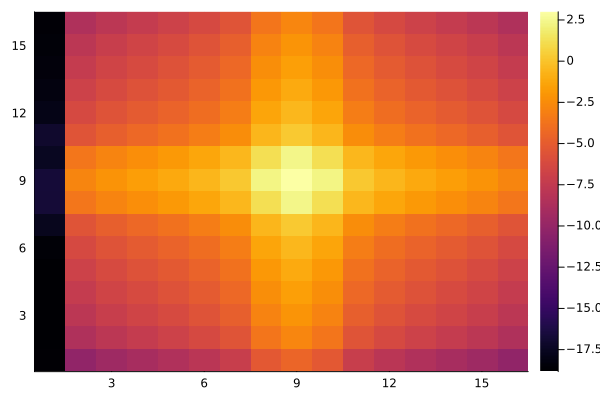

In [45]:
ssl = copy(sl)
for i = 1:length(sl)
    ssl[i] = abs2.(fftshift(fft(sl[i])))
end
heatmap(log10.(real(ssl[1][:,:,5])))
# heatmap(log10.(ssl[1][:,:,5]))

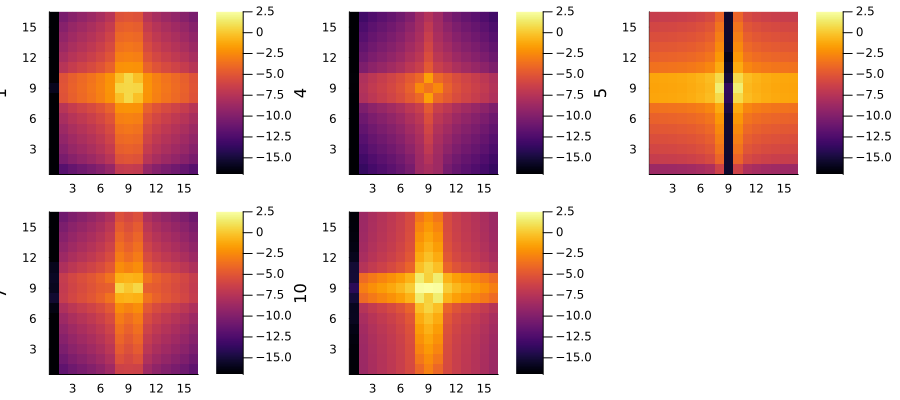

In [46]:
j = 1
ind = [1, 4, 5, 7, 10]
p2dheatspec = Array{Plots.Plot{Plots.GRBackend},1}(undef, 5)
for i = 1:5
    p2dheatspec[i] = heatmap(log10.(real(ssl[ind[i]][:,:,i])), ylabel = ind[i], #c = :grays,  #addedd real to the ssl 
        clims = (-17.,2.5)
    )
    #plot!(p2dheatspec[i], thpha[i][:,3], thpha[i][:,2], c = :black, legend = false)
end

plot(p2dheatspec..., size=(900, 400))
#png("sphereconcfft")

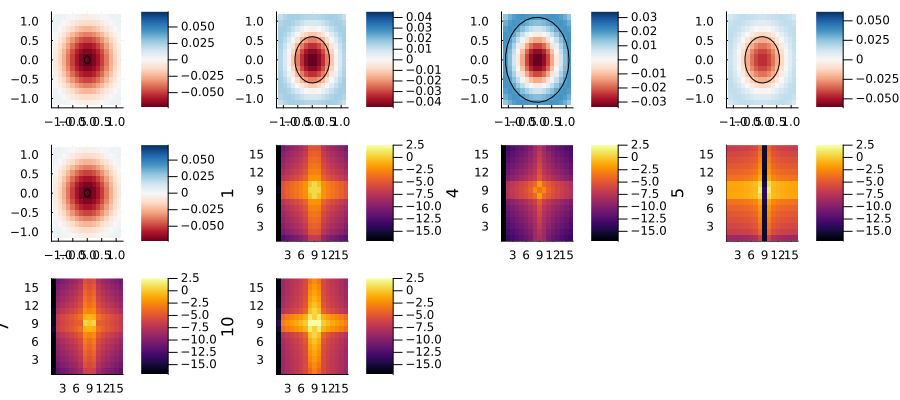

In [47]:
plot(p2dheat...,p2dheatspec..., size=(900, 400))

# Generalization to any shape

## Creating the shape 

In [1]:
using Interpolations
using Random
using Plots
using Statistics
include("localization3d.jl")
include("../src/relevant_slepian_alpha.jl")

get_quadrature_nodes_2D (generic function with 3 methods)

### Helper functions for making the shape

In [2]:
const perm = randperm(256)  # Create a fixed permutation array

256-element Vector{Int64}:
 120
 135
  47
 153
 200
  36
 182
  85
  49
 170
 134
   2
   4
   ⋮
 141
 106
 131
  83
 208
  95
  96
  50
 117
   3
  74
 154

In [3]:
function smoothstep(t)
    return t * t * (3 - 2 * t)
end

function lerp(a, b, t)
    return a + t * (b - a)
end

function grad(hash, x, y, z)
    h = hash & 15
    u = ifelse(h < 8, x, y)
    v = ifelse(h < 4, y, ifelse(h == 12 || h == 14, x, z))
    return ifelse((h & 1) == 0, u, -u) + ifelse((h & 2) == 0, v, -v)
end

grad (generic function with 1 method)

In [4]:
function noise(x, y, z)
    # Compute grid cell coordinates
    X = (floor(Int, x) & 255) + 1
    Y = (floor(Int, y) & 255) + 1
    Z = (floor(Int, z) & 255) + 1
    
    # Relative coordinates within grid cell
    x -= floor(x)
    y -= floor(y)
    z -= floor(z)
    
    # Compute fade curves for x, y, z
    u = smoothstep(x)
    v = smoothstep(y)
    w = smoothstep(z)
    
    # Hash coordinates of the cube corners
    A  = perm[X] + Y
    AA = perm[A] + Z
    AB = perm[A + 1] + Z
    B  = perm[X + 1] + Y
    BA = perm[B] + Z
    BB = perm[B + 1] + Z
    
    # Add blended results from the 8 corners of the cube
    return lerp(
        lerp(
            lerp(grad(perm[AA], x, y, z), grad(perm[BA], x - 1, y, z), u),
            lerp(grad(perm[AB], x, y - 1, z), grad(perm[BB], x - 1, y - 1, z), u),
            v
        ),
        lerp(
            lerp(grad(perm[AA + 1], x, y, z - 1), grad(perm[BA + 1], x - 1, y, z - 1), u),
            lerp(grad(perm[AB + 1], x, y - 1, z - 1), grad(perm[BB + 1], x - 1, y - 1, z - 1), u),
            v
        ),
        w
    )
end

function cubic_interpolate(p, x)
    # Cubic interpolation
    return p[2] + 0.5 * x * (p[3] - p[1] + x * (2.0 * p[1] - 5.0 * p[2] + 4.0 * p[3] - p[4] + x * (3.0 * (p[2] - p[3]) + p[4] - p[1])))
end

function interpolate_2d(grid, x, y)
    # Ensure x and y are within bounds
    nx, ny = size(grid)
    x = clamp(x, 1.0, nx - 2.0)
    y = clamp(y, 1.0, ny - 2.0)
    
    # Get integer and fractional parts of x and y
    x0, dx = floor(Int, x), x - floor(x)
    y0, dy = floor(Int, y), y - floor(y)
    
    # Extract a 4x4 patch around (x0, y0)
    patch = grid[max(1, x0 - 1):min(nx, x0 + 2), max(1, y0 - 1):min(ny, y0 + 2)]
    
    # Pad patch to ensure it's 4x4 (needed for cubic interpolation at boundaries)
    padded_patch = zeros(4, 4)
    padded_patch[1:size(patch, 1), 1:size(patch, 2)] .= patch
    
    # Interpolate along x for each of the four rows
    col_interp = [cubic_interpolate(padded_patch[:, i], dx) for i in 1:4]
    
    # Interpolate along y
    return cubic_interpolate(col_interp, dy)
end

interpolate_2d (generic function with 1 method)

In [5]:
function randSphere(; xm=0.0, ym=0.0, zm=0.0, r=1.0, dr=0.2, Nθ=100, Nφ=50)
    # Create grids for θ and φ
    θ = LinRange(0, 2π, Nθ)
    φ = LinRange(0, π, Nφ)
    
    # Generate noise-based perturbations
    perturbations = [r + dr * noise(θ_i / (2π), φ_j / π, 0.0) for θ_i in θ, φ_j in φ]
    
    # Fine grid for smooth sphere
    fine_θ = LinRange(0, 2π, Nθ * 10)
    fine_φ = LinRange(0, π, Nφ * 10)
    
    xs = []
    ys = []
    zs = []
    
    for φ_val in fine_φ
        for θ_val in fine_θ
            # Map θ and φ to grid indices
            θ_idx = (θ_val / (2π)) * (Nθ - 1) + 1
            φ_idx = (φ_val / π) * (Nφ - 1) + 1
            
            # Interpolate the radius
            radius = interpolate_2d(perturbations, θ_idx, φ_idx)
            
            # Convert to Cartesian coordinates
            push!(xs, xm + radius * sin(φ_val) * cos(θ_val))
            push!(ys, ym + radius * sin(φ_val) * sin(θ_val))
            push!(zs, zm + radius * cos(φ_val))
        end
    end
    
    return xs, ys, zs
end

randSphere (generic function with 1 method)

### Generate a perturbed sphere

In [6]:
# x,y = Slepians.randcirc(1.0,1.0,1.0,1,12)
xs, ys, zs = randSphere(xm=0.0, ym=0.0, zm=0.0, r=1.0, dr=0.4, Nθ=15, Nφ=50)

(Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  1.2210962386783225e-16, 1.2405427779693098e-16, 1.2577836774722035e-16, 1.2727882834968589e-16, 1.2855299184013276e-16, 1.2959859280237298e-16, 1.3041377219605282e-16, 1.309970806619587e-16, 1.3134748109892487e-16, 1.314643505077616e-16], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  -4.870436544380931e-17, -4.3513349844725474e-17, -3.8244969097550556e-17, -3.290859019099408e-17, -2.7513701012011396e-17, -2.206989347668702e-17, -1.6586846476157972e-17, -1.1074308667898087e-17, -5.54208114296161e-18, -3.219947921026319e-32], Any[0.9795984517263974, 0.9808030794965403, 0.9879277247475535, 0.9986567836393183, 1.0106746523317158, 1.0216657269846272, 1.029314403757934, 1.0313050788115175, 1.0253221483052586, 1.009050008399039  …  -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734878872773128, -1.0734

In [ ]:
scatter3d(xs, ys, zs, marker = (:circle, 1), color = :blue, label=false)

## Making Layers

In [ ]:
Nz = 7
min_z = minimum(zs)
max_z = maximum(zs)
z_pieces = collect(range(min_z, max_z; length=Nz))  # z intervals
tolerance = 0.005
filtered_points = [(x, y, z) for (x, y, z) in zip(xs, ys, zs) if any(abs(z - z_piece) <= tolerance for z_piece in z_pieces)]
fxs, fys, fzs = map(v -> [p[v] for p in filtered_points], (1, 2, 3))
scatter3d(fxs, fys, fzs, marker = (:circle, 5), color = :red, label=false)

### Plotting the ith layer

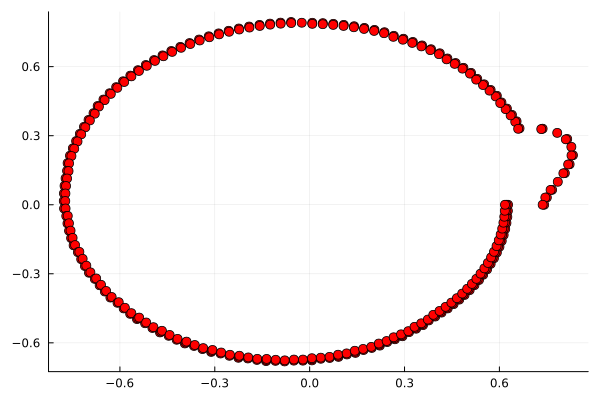

In [9]:
i = 2
z_piece = z_pieces[i]
# Filter points close to the current z_piece
filtered_points2 = [(x, y, z) for (x, y, z) in zip(xs, ys, zs) if abs(z - z_piece) <= tolerance]

# Extract x, y, z components
fxs2, fys2, _ = map(v -> [p[v] for p in filtered_points2], (1, 2, 3))

# Create scatter plot for the current piece
scatter(
    fxs2, fys2, 
    marker = (:circle, 5), 
    color = :red, 
    label = false,
)


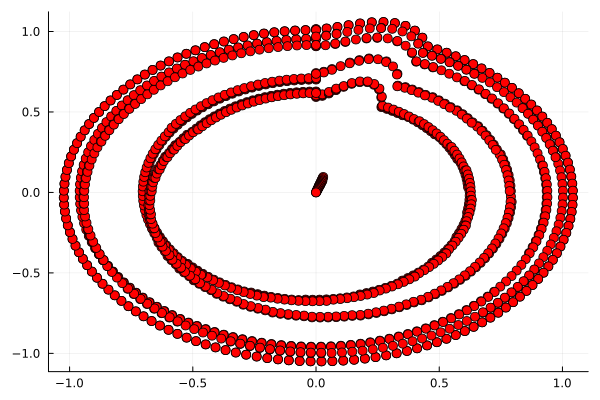

In [10]:
scatter(fys, fxs, marker = (:circle, 5), color = :red, label=false)

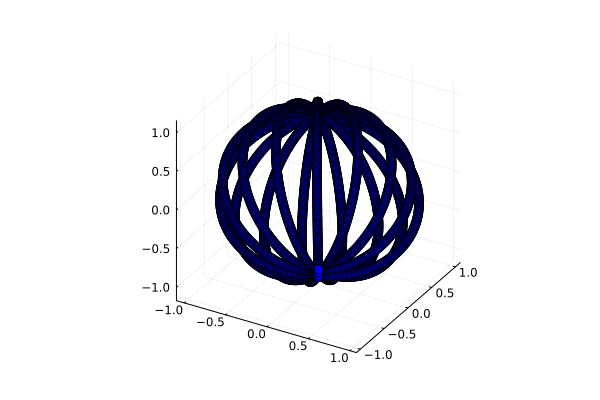

In [11]:
#for fun:
n = 20

# Select every nth element
xs_nth = xs[1:n:end]
ys_nth = ys[1:n:end]
zs_nth = zs[1:n:end]

# Plot every nth element
scatter3d(xs_nth, ys_nth, zs_nth, marker = (:circle, 5), color = :blue, label=false)

### Contouring

Vector{Float64}

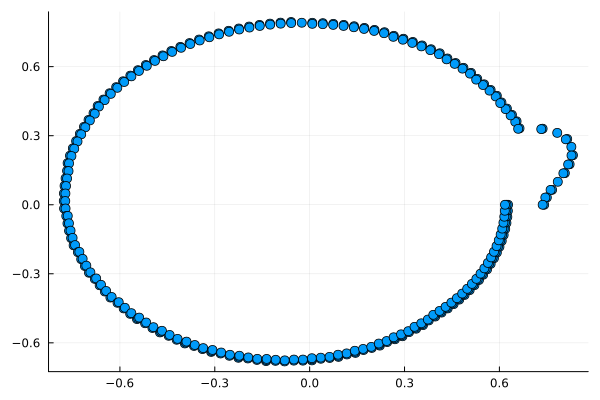

In [12]:
xx = []
yy = []
zz = collect(-((Nz-1)/2):((Nz-1)/2))

for z_piece in z_pieces
    group_points = [(x, y, z) for (x, y, z) in zip(xs, ys, zs) if abs(z - z_piece) <= tolerance]
    push!(xx, [p[1] for p in group_points])
    push!(yy, [p[2] for p in group_points])
end
print(typeof(xx[i]))
scatter(xx[i], yy[i], marker = (:circle, 5), label=false)

### Equalizing the number of elements in the vector

In [13]:
# function equalize_vectors(xx::Vector{Any}, yy::Vector{Any}, n::Int, s::Int)
#     # Filter out vectors with length < s
#     xx_filtered = [v for v in xx if length(v) >= s]
#     yy_filtered = [v for v in yy if length(v) >= s]
    
#     # Check if either filtered collection is empty
#     if isempty(xx_filtered) || isempty(yy_filtered)
#         println("No vectors remain after filtering with size threshold $s.")
#         return [], []
#     end
    
#     # Find the smallest vector length
#     min_len = minimum(length.(xx_filtered))
#     println("Size of the smallest vector: $min_len")  # Print the smallest vector size
#     max_len = maximum(length.(xx_filtered))
#     println("Size of the largest vector: $max_len")  # Print the largest vector size

#     # Reduce each vector in xx_filtered and yy_filtered to the minimum size
#     function reduce_to_size(vec::Vector{Float64}, target_size::Int, step::Int)
#         i = step
#         while length(vec) > target_size
#             if i > length(vec)
#                 i = step
#             end
#             deleteat!(vec, i)
#             i += step - 1
#         end
#         return vec
#     end
    
#     xx_resized = [reduce_to_size(copy(v), min_len, n) for v in xx_filtered]
#     yy_resized = [reduce_to_size(copy(v), min_len, n) for v in yy_filtered]

#     return xx_resized, yy_resized
# end


# xx, yy = equalize_vectors(xx, yy, 4, 40)

Size of the smallest vector: 218
Size of the largest vector: 381


([[0.8325029501404674, 0.8275838539184324, 0.8144001030024398, 0.8220195160848603, 0.7829121186870845, 0.8069005496306872, 0.7366302449614496, -0.05869915918781972, -0.09216711302086489, -0.19150078803586382  …  0.5272243429653859, 0.5524698373652586, 0.5636299721282224, 0.5737879933692945, 0.5910272667538268, 0.5980778680983223, 0.6040651088189984, 0.6128088375498315, 0.61554977952939, 0.6171962964642073], [1.022747553686507, 1.0164957245607644, 1.0001215281433282, 1.0191462845410815, 1.0208588267249434, 0.9698944090776446, 1.0098871973881849, 0.9260285948120146, -0.4796125871138133, -0.5166711073545666  …  0.8510915051168312, 0.8646455427677816, 0.8766622721972065, 0.8871203280987062, 0.8960011164305343, 0.9032888474751228, 0.9089705639126261, 0.9130361638585612, 0.9154784188245901, 0.9162929865705085], [1.0138353980013675, 1.0183426512981975, 1.0275702683009822, 1.0568600910985884, 1.058427370633298, 1.0346787746883321, 0.9613639778478817, 0.8882774156767512, 0.8678096739905082, 0.7

5(1090, 3)


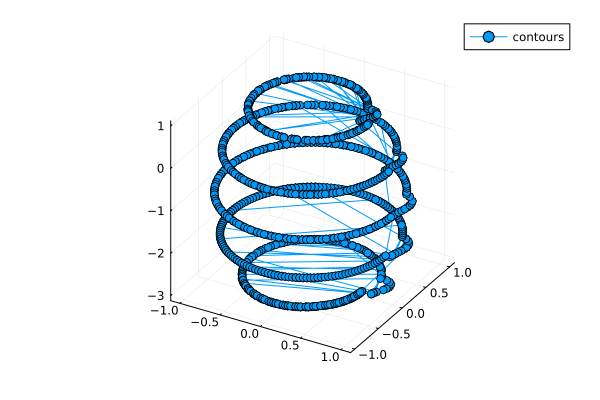

In [14]:
Nz = size(xx)[1]
print(Nz)
# z, y, x is the order
thpha = map(a -> hcat(ones(length(yy[a]))*zz[a], yy[a], xx[a]), 1:Nz)
#thpha = map(a -> hcat(ones(length(yy))*zz[a], (1.1-abs(zz[a]))*yy, (1.1-abs(zz[a]))*xx), 1:Nz)

# ind = vcat(collect(1:2:100), 100)

# Shorten the second closed curve
# thpha[2] = hcat(thpha[2][ind, 1], thpha[2][ind, 2], thpha[2][ind, 3])

thph = vcat(thpha...)
println(size(thph))

# This is necessary to close the curve
#thph = vcat(thph, thph[1,:]')

p = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", marker = :o)

In [19]:
#spline
N = 100
thpha_new = equalNclosedcurve(thpha, N);

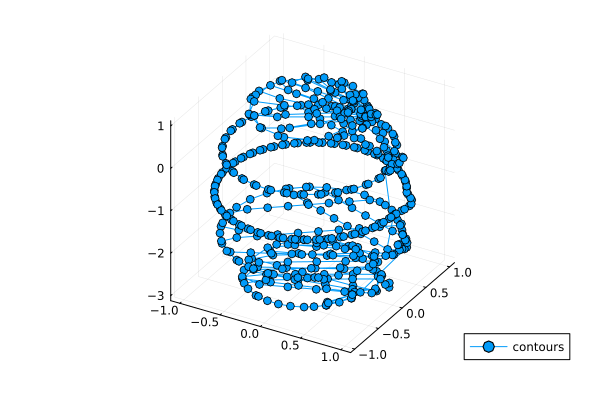

In [20]:
thph_new = vcat(thpha_new...)
p = plot(thph_new[:,3], thph_new[:,2], thph_new[:,1], label = "contours", marker = :o)

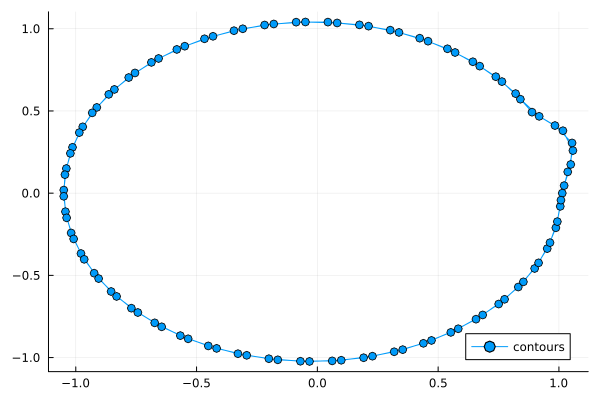

In [28]:
a = 3
p = plot(thpha_new[a][:,3], thpha_new[a][:,2], label = "contours", marker = :o)

In [23]:
Nqx = Nqy = 16
Nqz = 10

# set parameters for the integration

M  = 3
Kp = [4.0]
szs = int = (Nqx, Nqy, Nqz)
prec = 1e-8
exact = false
lvl = 6
maxrank = 256

256

In [24]:
z = [-2,-1,0,1,2,3]
colf, th, wqz = scale_quad_nodez(Nqz, z)

([1, 1, 1, 2, 3, 3, 4, 5, 5, 5], [-1.9347663212929294, -1.6626584167224614, -1.198523920747561, -0.5834884853231181, 0.127814152545922, 0.872185847454078, 1.5834884853231181, 2.198523920747561, 2.6626584167224614, 2.9347663212929294], [0.16667836077172052, 0.3736283728764514, 0.5477159062899551, 0.6731667982749913, 0.7388105617868823, 0.7388105617868823, 0.6731667982749913, 0.5477159062899551, 0.3736283728764514, 0.16667836077172052])

In [30]:
newcurve, pkg = fill2d(z, colf, thpha_new, th, Nqx, Nqy)

LoadError: Cannot find pairs of crossings.